**Pre-Process The Images:**
**Read Images:**
Read images one by one using OpenCV.


**Blur Detection:**
Detect if the images are blurry. If an image is blurry, apply a high-pass filter (sharpening) to enhance the details.


**Noise Detection:**
If the image is noisy, apply a low-pass filter (smoothing) to reduce the noise.


**Resizing:**
Resize all images to a suitable size that works well for OCR.
Here’s the detailed and corrected approach with code snippets:

In [ ]:
"""from google.colab import drive
drive.mount('/content/drive')"""

Mounted at /content/drive


In [ ]:
"""import zipfile
with zipfile.ZipFile("/content/drive/MyDrive/proof.zip","r") as zip_ref:
    zip_ref.extractall("/content/input_images")"""

**Pre=Processing, Detecting Blury and Noise in Images. Do Apply High Frequency Filter on Blur Images and Apply Low frequency Filters for removal of Noise, Resize all Images for Better Visuals amd change the Extension of All Images to
".jpeg"**

In [ ]:
"""import cv2
import numpy as np
import os
from glob import glob

def is_blurry(image, threshold=100):
    """Detect if the image is blurry."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
    return laplacian_var < threshold

def apply_high_pass_filter(image):
    """Apply high-pass filter to sharpen the image."""
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
    return cv2.filter2D(image, -1, kernel)

def apply_low_pass_filter(image):
    """Apply low-pass filter to smooth the image."""
    return cv2.GaussianBlur(image, (5, 5), 0)

def resize_image(image, target_width=1280):
    """Resize image while maintaining aspect ratio."""
    height, width = image.shape[:2]
    aspect_ratio = width / height
    new_width = target_width
    new_height = int(target_width / aspect_ratio)
    return cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_AREA)

def preprocess_images(input_folder, output_folder, blur_threshold=100, target_width=1280):
    """Pre-process images for better OCR."""
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    image_paths = glob(os.path.join(input_folder, '*'))
    for image_path in image_paths:
        # Read image
        image = cv2.imread(image_path)

        # Check if the image is blurry
        if is_blurry(image, blur_threshold):
            print(f"{image_path} is blurry, applying high-pass filter.")
            image = apply_high_pass_filter(image)
        else:
            # Apply low-pass filter to reduce noise if not blurry
            print(f"Applying low-pass filter to {image_path}.")
            image = apply_low_pass_filter(image)

        # Resize image
        print(f"Resizing {image_path}.")
        image = resize_image(image, target_width)

        # Change extension to jpeg and save
        base_name = os.path.basename(image_path)
        new_name = os.path.splitext(base_name)[0] + '.jpeg'
        processed_path = os.path.join(output_folder, new_name)
        cv2.imwrite(processed_path, image)
        print(f"Saved preprocessed image as {processed_path}.")

# Example usage
input_folder = '/content/input_images/proof'
output_folder = 'Filtered_OCR_Images'
preprocess_images(input_folder, output_folder)
"""

/content/input_images/proof/pictorial-proof-zuwkr.jpeg is blurry, applying high-pass filter.
Resizing /content/input_images/proof/pictorial-proof-zuwkr.jpeg.
Saved preprocessed image as Filtered_OCR_Images/pictorial-proof-zuwkr.jpeg.
Applying low-pass filter to /content/input_images/proof/pictorial-proof-9flpi (1).jpg.
Resizing /content/input_images/proof/pictorial-proof-9flpi (1).jpg.
Saved preprocessed image as Filtered_OCR_Images/pictorial-proof-9flpi (1).jpeg.
Applying low-pass filter to /content/input_images/proof/pictorial-proof-y0mgr.jpeg.
Resizing /content/input_images/proof/pictorial-proof-y0mgr.jpeg.
Saved preprocessed image as Filtered_OCR_Images/pictorial-proof-y0mgr.jpeg.
Applying low-pass filter to /content/input_images/proof/pictorial-proof-cuoqy.jpg.
Resizing /content/input_images/proof/pictorial-proof-cuoqy.jpg.
Saved preprocessed image as Filtered_OCR_Images/pictorial-proof-cuoqy.jpeg.
Applying low-pass filter to /content/input_images/proof/pictorial-proof-l7t3d.png.


**Pre-processing (Detect Blury, Noise, Resize, Tilted, Extension[.jpeg])

OCR for English

OCR for Digits

OCR for Urdu

Understand the format of respective fields

Develop lists, Map format texts & Digits to respective list. I.e. Name, Gender, DOB, CNIC Number, Expiry, Issue date**

In [ ]:
!pip install pytesseract
import pytesseract
import cv2

# If Tesseract is not in your PATH, specify the location directly
pytesseract.pytesseract.tesseract_cmd = r'/content/tesseract-ocr-setup-3.02.02.exe'  # Update this path as needed

# Load the input image and convert it from BGR to RGB channel ordering
image = cv2.imread('/content/pictorial-proof-xk51w.jpg')
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Initialize Tesseract OCR options as an empty string
options = ""

# If you want to perform digit-only OCR, update the Tesseract OCR options
digit_only = True  # Change this to False if you don't want digit-only OCR
if digit_only:
    options = "outputbase digits"

# OCR the input image using Tesseract
text = pytesseract.image_to_string(rgb, config=options)
print(text)


PermissionError: [Errno 13] Permission denied: '/content/tesseract-ocr-setup-3.02.02.exe'

**Dealing With Tilted Images**

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 46.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 39.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylin

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

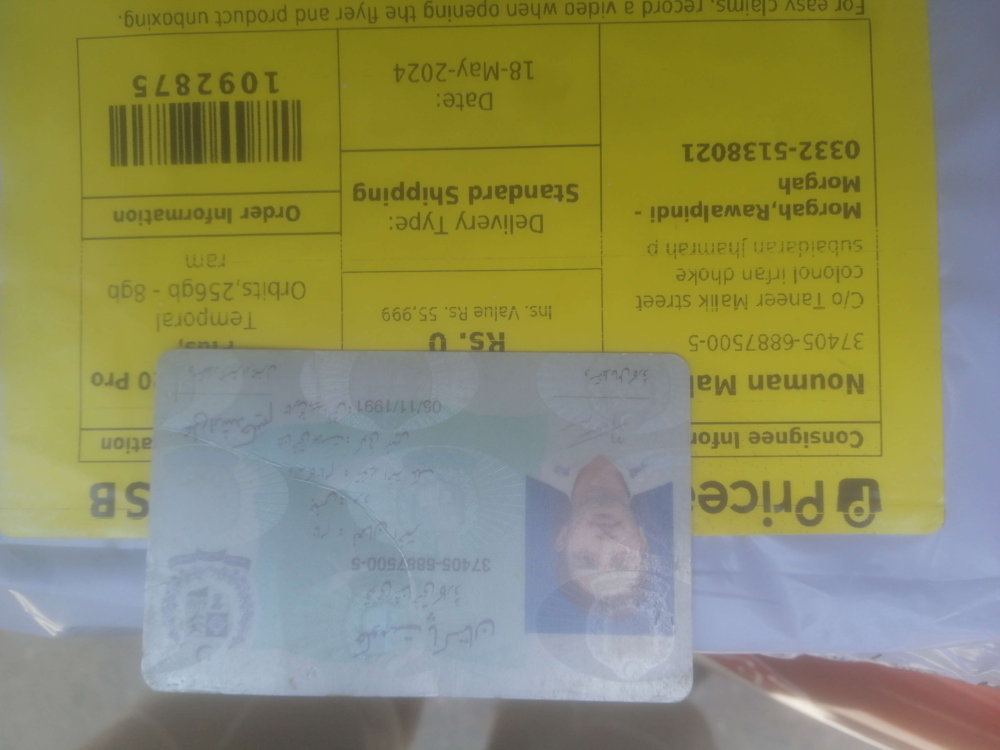

Corrected Image with angle: 0.00 degrees


In [ ]:
!pip install easyocr

import cv2
import numpy as np
import easyocr
from google.colab.patches import cv2_imshow

def correct_skew(image, boxes):
    # Initialize a list to store angles
    angles = []

    # Iterate through the bounding boxes
    for box in boxes:
        # Get the top-left and top-right points
        (tl, tr, br, bl) = box

        # Calculate the angle of the top line of the bounding box
        angle = np.arctan2(tr[1] - tl[1], tr[0] - tl[0])
        angles.append(np.degrees(angle))

    # Compute the median angle to correct skew
    median_angle = np.median(angles)

    # Rotate the image to correct the skew
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, median_angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated, median_angle

# Initialize the EasyOCR reader
reader = easyocr.Reader(['ur', 'en'])

# Read the image
image_path = '/content/pictorial-proof-xk51w.jpg'
image = cv2.imread(image_path)

# Use EasyOCR to detect text
result = reader.readtext(image)

# Extract bounding boxes
bounding_boxes = [res[0] for res in result]

# Correct the skew based on the bounding boxes
corrected_image, angle = correct_skew(image, bounding_boxes)

# Display the corrected image
cv2_imshow(corrected_image)
print(f'Corrected Image with angle: {angle:.2f} degrees')




In [ ]:
# Define the path to save the corrected image
corrected_image_path = '/content/corrected_Image.jpg'

# Save the corrected image
cv2.imwrite(corrected_image_path, corrected_image)

print(f'Corrected image saved at: {corrected_image_path}')

Corrected image saved at: /content/corrected_Image.jpg


# 1. English TEXT OCR from Images, Using PaddlePaddle OCR Technique

Looking in indexes: https://mirror.baidu.com/pypi/simple
ERROR: Could not find a version that satisfies the requirement paddlepaddle-gpu==2.0.0 (from versions: 2.3.0, 2.3.1, 2.3.2, 2.4.0rc0, 2.4.0, 2.4.1, 2.4.2, 2.5.0rc0, 2.5.0rc1, 2.5.0, 2.5.1, 2.5.2, 2.6.0, 2.6.1)
ERROR: No matching distribution found for paddlepaddle-gpu==2.0.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 407.3/407.3 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 25.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 35.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.4/88.4 kB 14.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fire: filename=fire-0.6.0-py2.py3-none-any.whl size=117029 sha256=a4b9e68aa790ce062558d7447429085ea4880f65b10333443

100%|██████████| 4.00M/4.00M [00:06<00:00, 585kiB/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer/en_PP-OCRv4_rec_infer.tar


100%|██████████| 10.2M/10.2M [00:01<00:00, 5.97MiB/s]


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2.19M/2.19M [00:01<00:00, 1.78MiB/s]

[2024/07/09 06:26:11] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_c

[2024/07/09 06:26:13] ppocr DEBUG: dt_boxes num : 33, elapsed : 0.39290904998779297
[2024/07/09 06:26:14] ppocr DEBUG: cls num  : 33, elapsed : 0.19443345069885254
[2024/07/09 06:26:17] ppocr DEBUG: rec_res num  : 33, elapsed : 3.4751079082489014
Raw OCR Result: [[[[[2222.0, 559.0], [2443.0, 569.0], [2403.0, 1419.0], [2181.0, 1409.0]], ('PPrice', 0.9545291066169739)], [[[1693.0, 606.0], [1826.0, 604.0], [1837.0, 1424.0], [1704.0, 1426.0]], ('Nouman Mal', 0.9582537412643433)], [[[1964.0, 600.0], [2082.0, 601.0], [2071.0, 1426.0], [1953.0, 1425.0]], ('ConsigneeInfor', 0.9946193099021912)], [[[897.0, 621.0], [1015.0, 618.0], [1042.0, 1640.0], [924.0, 1643.0]], ('Morgah,Rawalpindi', 0.9906417727470398)], [[[1325.0, 621.0], [1428.0, 619.0], [1449.0, 1679.0], [1346.0, 1681.0]], ('C/o Taneer Maiik street', 0.9127971529960632)], [[[1521.0, 615.0], [1625.0, 614.0], [1635.0, 1439.0], [1532.0, 1440.0]], ('37405-6887500-5', 0.9941301345825195)], [[[623.0, 631.0], [740.0, 628.0], [762.0, 1467.0], [

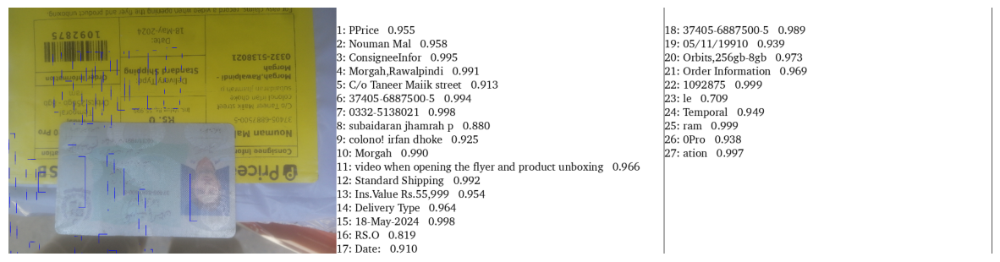

(3456, 4608, 3)

In [ ]:
# GitHub repo installation of paddle
!python -m pip install paddlepaddle-gpu==2.0.0 -i https://mirror.baidu.com/pypi/simple


# Install paddle OCR
!pip install paddleocr

# Clone paddle OCR repo - get FONTS for visualization
!git clone https://github.com/PaddlePaddle/PaddleOCR

!pip install paddlepaddle


from paddleocr import PaddleOCR, draw_ocr
from matplotlib import pyplot as plt
import cv2

# Initialize the OCR model for Urdu
ocr = PaddleOCR(use_angle_cls=True, lang='en')

# Sample image path (replace with your actual image path)
image_path = '/content/pictorial-proof-xk51w.jpg'

# Read the image using OpenCV
img = cv2.imread(image_path)

# Perform OCR on the image
result = ocr.ocr(image_path, cls=True)

# Debug: Print the raw OCR result to understand its structure
print("Raw OCR Result:", result)

# Extract results with debugging statements
try:
    boxes = [line[0] for line in result[0]]
    texts = [line[1][0] for line in result[0]]
    scores = [line[1][1] for line in result[0]]

    # Debug: Print extracted information to check correctness
    print("Boxes:", boxes)
    print("Texts:", texts)
    print("Scores:", scores)
except Exception as e:
    print("Error during extraction:", e)

# Path to a TrueType font file (replace with the actual path to a font file)
font_path = '/content/PaddleOCR/doc/fonts/latin.ttf'

# Resize display area
plt.figure(figsize=(15, 15))

try:
    # Draw annotations on the image
    annotated = draw_ocr(img, boxes, texts, scores, font_path=font_path)

    # Convert the annotated image from BGR to RGB
    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

    # Show the image using matplotlib
    plt.imshow(annotated)
    plt.axis('off')  # Hide axes
    plt.show()
except Exception as e:
    print("Error during visualization:", e)

img.shape

# 2 Urdu TEXT OCR from Images, Utilyzing EasyOCR Technique

In [ ]:
!pip install easyocr
import easyocr
import matplotlib as plt
import numpy as np
reader = easyocr.Reader(['ur', 'ur'])

import cv2
#from cv2 import cv2_imread
img = cv2.imread('/content/tilted_Image.jpg')

# Initialize the EasyOCR reader
#reader = easyocr.Reader(['en', 'en'])


# Convert the image to RGB (EasyOCR expects RGB images)
image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Use EasyOCR to read text from the image
result = reader.readtext(image_rgb, detail=0, paragraph=True)

# Print the result
print(result)





['ّ   ؟', 'آآ [ ٤٨دد٧ | ّ ؟ 7{0710 ٤7  ّ { [ ذا  !!0ں', '؟']


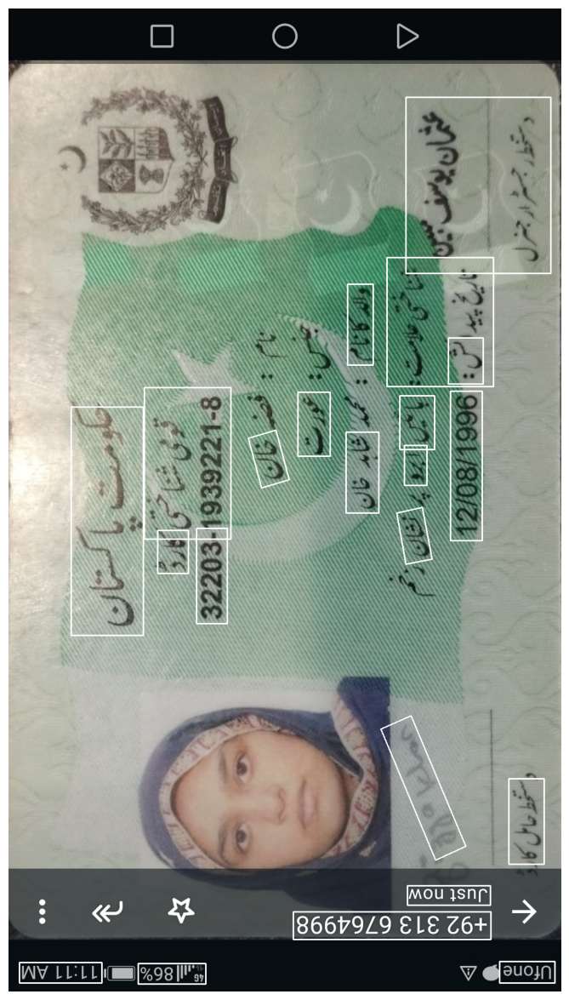

(1920, 1080, 3)
['3 ', '~', 'یژ', 'ذ?', 'ا', 'ح', '3ُُِ', 'پە', '7', 'ّ', '5', '?', '3', '3', 'ع٨ی1 ٨٧', '86669/9 &،& 76+', ' ٧ ٧:،', '%98 /|"`97', '٨ر٥٧0', '0', '9', 'ّ']


In [ ]:
import cv2
import easyocr
import matplotlib.pyplot as plt  # Ensure the correct import
import numpy as np

# Initialize the EasyOCR reader for Urdu
reader = easyocr.Reader(['ur', 'ur'])

# Read the image
img = cv2.imread('/content/corrected_Image.jpg')

# Process the image to get text detection results
result = reader.readtext(img)

# Extract bounding boxes, texts, and scores
boxes_urdu = [res[0] for res in result]
texts_urdu = [res[1] for res in result]
scores_urdu = [res[2] for res in result]

# Annotate the Urdu text
annotated_urdu = img.copy()
for box in boxes_urdu:
    # Ensure box is a 2D array with shape (4, 2)
    box_points = np.array(box).reshape(-1, 1, 2).astype(int)
    cv2.polylines(annotated_urdu, [box_points], True, (255, 255, 255), 2)

# Convert the image from BGR to RGB
annotated_urdu_rgb = cv2.cvtColor(annotated_urdu, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(15, 15))
plt.imshow(annotated_urdu_rgb)
plt.axis('off')  # Hide axes
plt.show()

# Output the shape of the original image
print(img.shape)
print(texts_urdu)

**To achieve the functionality where the code first checks if the image contains English text with specific fields and then decides whether to perform OCR for Urdu,**

 we can follow these steps:

Perform OCR for English first and check for the presence of specific fields.
If those fields are found, save and display the English OCR result.
If those fields are not found, perform OCR for Urdu.
Visualize and save the Urdu OCR result if the fields are not found in English.

In [ ]:
"""# Install necessary packages
!python -m pip install paddlepaddle-gpu==2.0.0 -i https://mirror.baidu.com/pypi/simple
!pip install paddleocr easyocr
!git clone https://github.com/PaddlePaddle/PaddleOCR
!pip install paddlepaddle

import cv2
from paddleocr import PaddleOCR, draw_ocr
import easyocr
from matplotlib import pyplot as plt

# Initialize the OCR model for English
ocr_eng = PaddleOCR(use_angle_cls=True, lang='en')
# Initialize the OCR model for Urdu
reader_urdu = easyocr.Reader(['ur', 'ur'])

# Function to check for specific fields in English OCR result
def contains_english_fields(texts, fields):
    return all(any(field in text for text in texts) for field in fields)

# Function to perform OCR and visualization
def perform_ocr_and_visualize(image_path, ocr_result, font_path, output_image_path):
    # Extract results with debugging statements
    try:
        boxes = [line[0] for line in ocr_result[0]]
        texts = [line[1][0] for line in ocr_result[0]]
        scores = [line[1][1] for line in ocr_result[0]]

        # Draw annotations on the image
        annotated = draw_ocr(img, boxes, texts, scores, font_path=font_path)
        # Convert the annotated image from BGR to RGB
        annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

        # Save and show the image using matplotlib
        plt.figure(figsize=(15, 15))
        plt.imshow(annotated)
        plt.axis('off')  # Hide axes
        plt.show()

        # Save the output image
        cv2.imwrite(output_image_path, annotated)
        print(f"Saved annotated image as {output_image_path}")
    except Exception as e:
        print("Error during visualization:", e)

# Define paths and fields to check
image_path = '/content/pictorial-proof-xk51w (1).jpg'
font_path = '/content/PaddleOCR/doc/fonts/latin.ttf'
output_image_path_eng = '/content/english_ocr_result.jpeg'
output_image_path_urdu = '/content/urdu_ocr_result.jpeg'
fields_to_check = ['Father Name', 'Gender', 'Date of Birth']

# Read the image using OpenCV
img = cv2.imread(image_path)

# Perform OCR on the image for English
result_eng = ocr_eng.ocr(image_path, cls=True)

# Debug: Print the raw OCR result to understand its structure
print("Raw English OCR Result:", result_eng)

# Extract texts from English OCR result
texts_eng = [line[1][0] for line in result_eng[0]]

# Check for specific fields in English OCR result
if contains_english_fields(texts_eng, fields_to_check):
    print("English fields found, performing visualization for English OCR.")
    perform_ocr_and_visualize(image_path, result_eng, font_path, output_image_path_eng)
else:
    print("English fields not found, performing OCR for Urdu.")
    # Perform OCR for Urdu
    result_urdu = reader_urdu.readtext(image_path)

    # Debug: Print the raw Urdu OCR result to understand its structure
    print("Raw Urdu OCR Result:", result_urdu)

    # Extract results from Urdu OCR
    boxes_urdu = [res[0] for res in result_urdu]
    texts_urdu = [res[1] for res in result_urdu]
    scores_urdu = [res[2] for res in result_urdu]

    # Draw annotations on the image for Urdu OCR
    annotated_urdu = img.copy()
    for (box, text, score) in zip(boxes_urdu, texts_urdu, scores_urdu):
        cv2.polylines(annotated_urdu, [np.array(box).astype(int)], True, (0, 255, 0), 2)
        cv2.putText(annotated_urdu, text, tuple(np.array(box[0]).astype(int)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    # Convert the annotated image from BGR to RGB
    annotated_urdu = cv2.cvtColor(annotated_urdu, cv2.COLOR_BGR2RGB)

    # Save and show the Urdu OCR result
    plt.figure(figsize=(15, 15))
    plt.imshow(annotated_urdu)
    plt.axis('off')  # Hide axes
    plt.show()

    # Save the output image
    cv2.imwrite(output_image_path_urdu, annotated_urdu)
    print(f"Saved annotated image as {output_image_path_urdu}")

img.shape
"""

Looking in indexes: https://mirror.baidu.com/pypi/simple
ERROR: Could not find a version that satisfies the requirement paddlepaddle-gpu==2.0.0 (from versions: 2.3.0, 2.3.1, 2.3.2, 2.4.0rc0, 2.4.0, 2.4.1, 2.4.2, 2.5.0rc0, 2.5.0rc1, 2.5.0, 2.5.1, 2.5.2, 2.6.0, 2.6.1)
ERROR: No matching distribution found for paddlepaddle-gpu==2.0.0
fatal: destination path 'PaddleOCR' already exists and is not an empty directory.
[2024/06/03 13:45:55] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east

[2024/06/03 13:46:03] ppocr DEBUG: dt_boxes num : 33, elapsed : 0.5451209545135498
[2024/06/03 13:46:04] ppocr DEBUG: cls num  : 33, elapsed : 0.14884185791015625
[2024/06/03 13:46:06] ppocr DEBUG: rec_res num  : 33, elapsed : 2.0779905319213867
Raw English OCR Result: [[[[[2222.0, 559.0], [2443.0, 569.0], [2403.0, 1419.0], [2181.0, 1409.0]], ('PPrice', 0.9545291066169739)], [[[1693.0, 606.0], [1826.0, 604.0], [1837.0, 1424.0], [1704.0, 1426.0]], ('Nouman Mal', 0.9582537412643433)], [[[1964.0, 600.0], [2082.0, 601.0], [2071.0, 1426.0], [1953.0, 1425.0]], ('ConsigneeInfor', 0.9946193099021912)], [[[897.0, 621.0], [1015.0, 618.0], [1042.0, 1640.0], [924.0, 1643.0]], ('Morgah,Rawalpindi', 0.9906417727470398)], [[[1325.0, 621.0], [1428.0, 619.0], [1449.0, 1679.0], [1346.0, 1681.0]], ('C/o Taneer Maiik street', 0.9127971529960632)], [[[1521.0, 615.0], [1625.0, 614.0], [1635.0, 1439.0], [1532.0, 1440.0]], ('37405-6887500-5', 0.9941301345825195)], [[[623.0, 631.0], [740.0, 628.0], [762.0, 146

error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/resize.cpp:4062: error: (-215:Assertion failed) !ssize.empty() in function 'resize'
